# Text 2 Image with Stable Diffusion

- **Stable diffusion** is a model proposed by CompVis, Stability.ai and LAION. It is the first completely open source image generation project for **text 2 image.**
- The model was trained on the LAION-5B dataset, which contains almost **5 billion image/text pairs**, available in several languages.
- The training took **150,000 hours**, and was performed using **256 Nvidia A100 GPUs**. The total cost of the training is **600,000$** according to Wikipedia.

These examples are made with version 1.4 (Need to test with the brand new version 2!)

https://huggingface.co/CompVis/stable-diffusion-v1-4

In [1]:
#!pip install -q --upgrade pip
#!pip install -q --upgrade diffusers transformers scipy ftfy huggingface_hub roboflow

In [5]:
import cv2
import datetime
import GPUtil
import imageio
import os
import sys
import time
import torch

from diffusers import StableDiffusionPipeline
from IPython.display import Image

%matplotlib inline

## 0. Infos

In [3]:
sys.version

'3.8.5 (default, Sep  4 2020, 07:30:14) \n[GCC 7.3.0]'

In [4]:
!nvidia-smi

Tue Nov 29 08:38:50 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.141.03   Driver Version: 470.141.03   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           On   | 00000001:00:00.0 Off |                    0 |
| N/A   50C    P8    27W / 149W |      3MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  Tesla K80           On   | 00000002:00:00.0 Off |                    0 |
| N/A   

In [7]:
print("GPUs")
GPUtil.showUtilization()

GPUs
| ID | GPU | MEM |
------------------
|  0 |  0% |  0% |
|  1 |  0% |  0% |
|  2 |  0% |  0% |
|  3 |  0% |  0% |


## 1. Images Directory to save the images

In [8]:
IMAGES_DIR = "images"

print("Creating or using directory:", IMAGES_DIR)
os.makedirs(IMAGES_DIR, exist_ok=True)

Creating or using directory: images


## 2. Stable Diffusion Pipeline

> You need to create a HugginFace account and generate a **token** to use the Stable Diffusion model.

In [9]:
MY_TOKEN = "To_be_replaced"

In [10]:
print("Creating the Stable Diffusion Pipeline...")

pipe = StableDiffusionPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4",
    use_auth_token=MY_TOKEN
)

pipe.to("cuda")
print("\nDone")

Creating the Stable Diffusion Pipeline...


Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

/anaconda/envs/azureml_py38/lib/python3.8/site-packages/diffusers/models/attention.py:433: UserWarning: Could not enable memory efficient attention. Make sure xformers is installed correctly and a GPU is available: No such operator xformers::efficient_attention_forward_generic - did you forget to build xformers with `python setup.py develop`?
  warnings.warn(



Done


## 3. Functions

In [11]:
def text_to_image(prompt,
                  same=True,
                  disp=True,
                  guidance_scale=7.5,
                  num_inference_steps=50):
    """
    Generating the Text to Image
    """
    start_time = time.time()
    now = str(datetime.datetime.today().strftime('%d%b%Y_%H%M%S'))

    print("\033[1;31;34m")
    print("Running Stable diffusion to generate an image from text:")
    print("\033[1;31;32m")
    print(prompt)
    print("\033[0m")
    print("Please wait...")

    # Testing if we want the same generated image
    if same:
        generator = torch.Generator("cuda").manual_seed(123456)
        image = pipe(prompt,
                     guidance_scale=guidance_scale,
                     num_inference_steps=num_inference_steps,
                     generator=generator).images[0]

    # A different generated image will be created
    if not same:
        image = pipe(prompt,
                     guidance_scale=guidance_scale,
                     num_inference_steps=num_inference_steps).images[0]

    print("Done in", round(time.time() - start_time), "seconds")
    
    # Text to add into the image
    if len(prompt) >= 95:
        header_txt = prompt[:90] + " ..."
    
    else:
        header_txt = prompt
    
    # Text to be part of the saved image filename
    prompt_txt = header_txt.replace(',', '_')
    prompt_txt = prompt_txt.replace('.', '_')
    prompt_txt = prompt_txt.replace(' ', '_')
    
    # Saving raw generated image
    raw_generated_image = IMAGES_DIR + '/' + prompt_txt + '_' + now + '.jpg'
    image.save(raw_generated_image)

    # Saving generated image with the prompt in it
    img = cv2.imread(raw_generated_image)
    
    cv2.rectangle(img, (0, 0), (512, 30), (0, 0, 0), -1)
    cv2.putText(img, header_txt, (10, 20), cv2.FONT_HERSHEY_SIMPLEX, 0.3,
                (255, 255, 255), 1, cv2.LINE_AA)

    footer_txt = "Made with Azure ML and Hugging Face Stable Diffusion"
    cv2.rectangle(img, (0, 490), (275, 512), (0, 0, 0), -1)
    cv2.putText(img, footer_txt, (5, 501), cv2.FONT_HERSHEY_SIMPLEX, 0.3,
                (0, 255, 0), 1, cv2.LINE_AA)
    
    generated_image = IMAGES_DIR + '/' + prompt_txt + '_' + now + '_with_prompt.jpg'
    cv2.imwrite(generated_image, img, [int(cv2.IMWRITE_JPEG_QUALITY), 100])

    print("\nImage saved:", generated_image)

    # Viewing image
    if disp:
        display(Image(filename=generated_image, width=512, height=512))

## 4. Testing

### Simple example

In [12]:
prompt = "a photo of a tree close to a river, good composition, hyper realistic"


Running Stable diffusion to generate an image from text:

a photo of a tree close to a river, good composition, hyper realistic

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 73 seconds

Image saved: images/a_photo_of_a_tree_close_to_a_river__good_composition__hyper_realistic_29Nov2022_084018_with_prompt.jpg


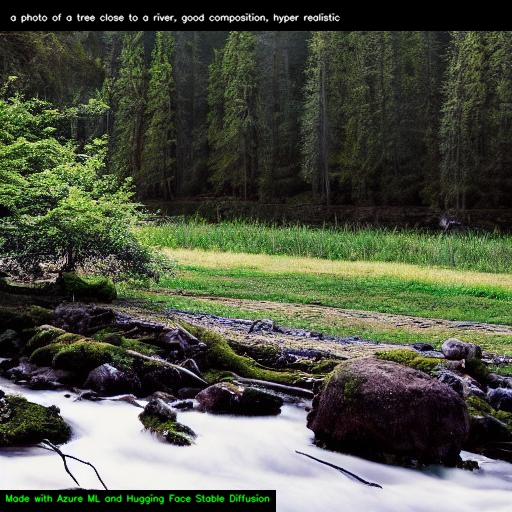

In [13]:
text_to_image(prompt,
              same=False,  # Will always generate a different image
              disp=True)  # To display the generated image

### Another test using the same prompt (this will generate always the same image)


Running Stable diffusion to generate an image from text:

a photo of a tree close to a river, good composition, hyper realistic

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 73 seconds

Image saved: images/a_photo_of_a_tree_close_to_a_river__good_composition__hyper_realistic_29Nov2022_084138_with_prompt.jpg


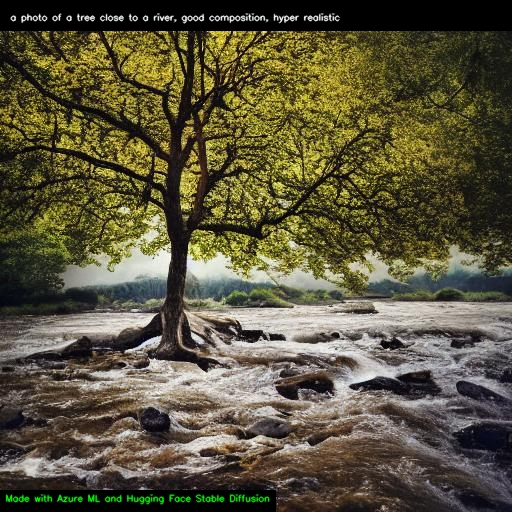

In [14]:
text_to_image(prompt,
              same=True,  # Will generate always the same image at each call
              disp=True)

### Multiple images using the same prompt

In [15]:
prompt = "A tree in a park in a foggy day during winter"

Image 1 of 3

Running Stable diffusion to generate an image from text:

A tree in a park in a foggy day during winter

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 73 seconds

Image saved: images/A_tree_in_a_park_in_a_foggy_day_during_winter_29Nov2022_084251_with_prompt.jpg


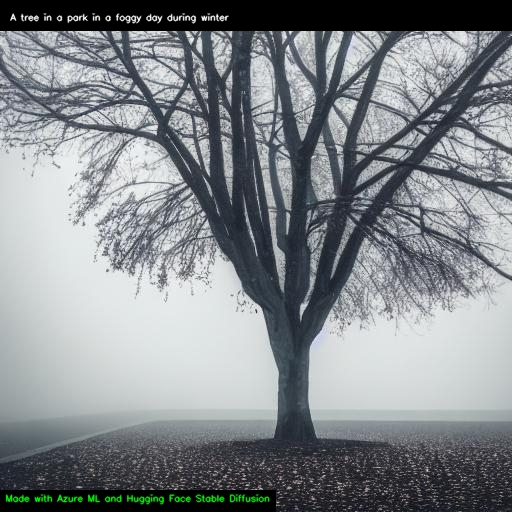

Image 2 of 3

Running Stable diffusion to generate an image from text:

A tree in a park in a foggy day during winter

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 74 seconds

Image saved: images/A_tree_in_a_park_in_a_foggy_day_during_winter_29Nov2022_084405_with_prompt.jpg


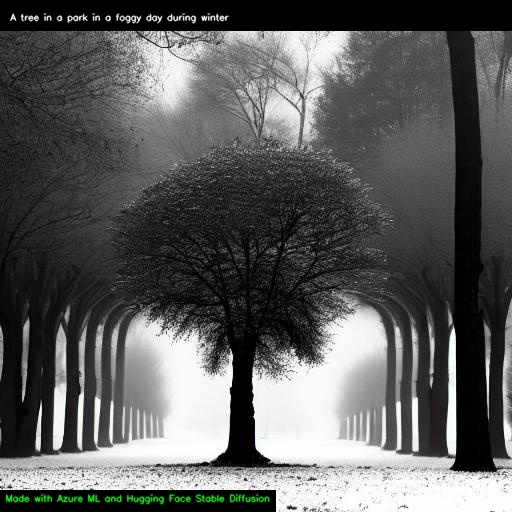

Image 3 of 3

Running Stable diffusion to generate an image from text:

A tree in a park in a foggy day during winter

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 74 seconds

Image saved: images/A_tree_in_a_park_in_a_foggy_day_during_winter_29Nov2022_084519_with_prompt.jpg


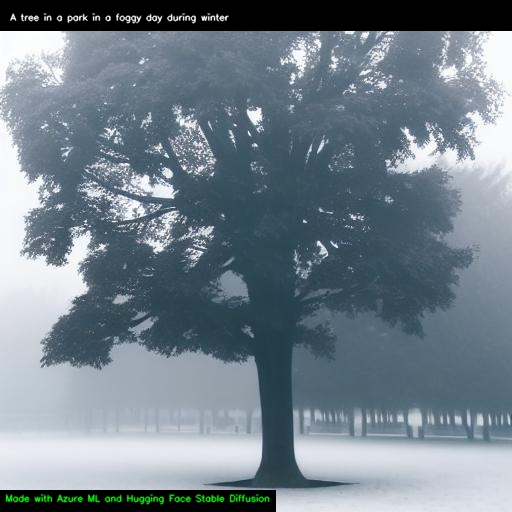

In [16]:
nb_images = 3

for idx in range(nb_images):
    print("Image", idx + 1, "of", nb_images)
    text_to_image(prompt,
                  same=False,
                  disp=True,
                  guidance_scale=15,
                  num_inference_steps=50)

### Another tests with different prompts and options

In [17]:
prompt = "Beautiful digital matte pastel paint sunflowers poppies chillwave\
 Daniel Wade artstation"


Running Stable diffusion to generate an image from text:

Beautiful digital matte pastel paint sunflowers poppies chillwave Daniel Wade artstation

Please wait...


  0%|          | 0/101 [00:00<?, ?it/s]

Done in 146 seconds

Image saved: images/Beautiful_digital_matte_pastel_paint_sunflowers_poppies_chillwave_Daniel_Wade_artstation_29Nov2022_084633_with_prompt.jpg


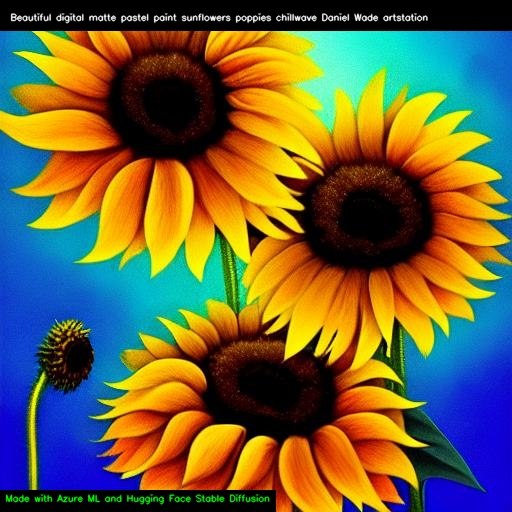

In [18]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=21,
              num_inference_steps=100)

In [19]:
prompt = "A road diverging in two different directions"


Running Stable diffusion to generate an image from text:

A road diverging in two different directions

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 75 seconds

Image saved: images/A_road_diverging_in_two_different_directions_29Nov2022_084859_with_prompt.jpg


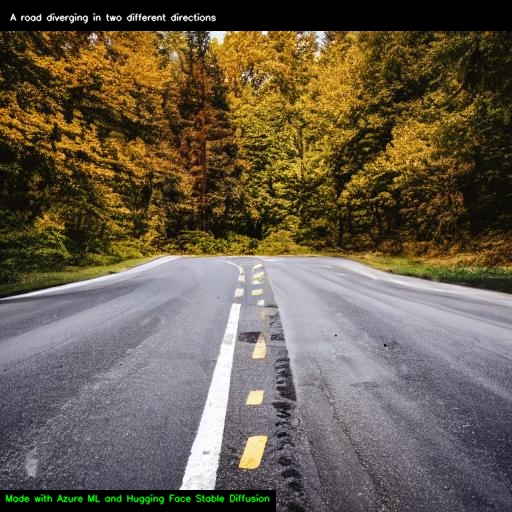

In [20]:
text_to_image(prompt,
              same=True,
              disp=True,
             )

In [21]:
prompt = "Close-up photography of the face of a 30 years old man with brown eyes,\
 (by Alyssa Monks:1.1), by Joseph Lorusso, by Lilia Alvarado, beautiful lighting,\
 sharp focus, 8k, high res, (pores:0.1), (sweaty:0.8), Masterpiece, Nikon Z9,\
 Award - winning photograph"

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['photograph']



Running Stable diffusion to generate an image from text:

Close-up photography of the face of a 30 years old man with brown eyes, (by Alyssa Monks:1.1), by Joseph Lorusso, by Lilia Alvarado, beautiful lighting, sharp focus, 8k, high res, (pores:0.1), (sweaty:0.8), Masterpiece, Nikon Z9, Award - winning photograph

Please wait...


  0%|          | 0/76 [00:00<?, ?it/s]

Done in 111 seconds

Image saved: images/Close-up_photography_of_the_face_of_a_30_years_old_man_with_brown_eyes__(by_Alyssa_Monks:1_____29Nov2022_085014_with_prompt.jpg


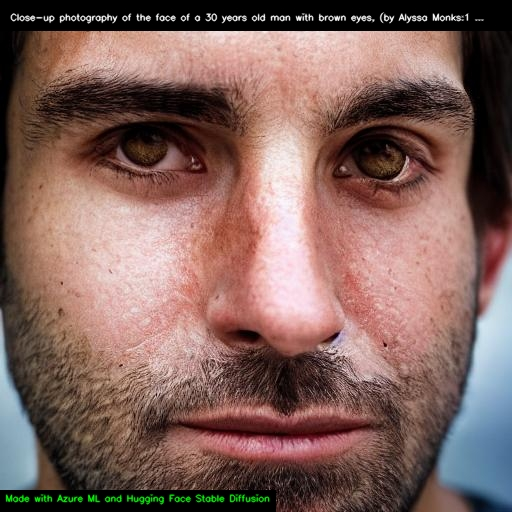

In [22]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=10,
              num_inference_steps=75)

In [23]:
prompt = "A lady and a child in a appartment in the style of Edward Hopper, kitchen,\
 window, sharp focus, high res"


Running Stable diffusion to generate an image from text:

A lady and a child in a appartment in the style of Edward Hopper, kitchen, window, sharp focus, high res

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 75 seconds

Image saved: images/A_lady_and_a_child_in_a_appartment_in_the_style_of_Edward_Hopper__kitchen__window__sharp_f_____29Nov2022_085211_with_prompt.jpg


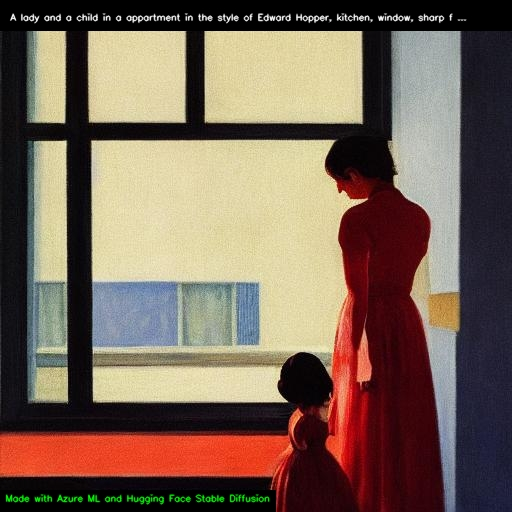

In [24]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=50)

In [25]:
prompt = "Two children playing soccer in a street in the style of Henri Rousseau"


Running Stable diffusion to generate an image from text:

Two children playing soccer in a street in the style of Henri Rousseau

Please wait...


  0%|          | 0/101 [00:00<?, ?it/s]

Done in 147 seconds

Image saved: images/Two_children_playing_soccer_in_a_street_in_the_style_of_Henri_Rousseau_29Nov2022_085338_with_prompt.jpg


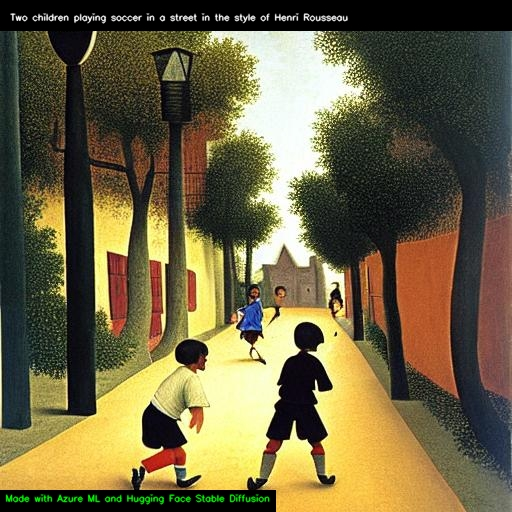

In [26]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=15,
              num_inference_steps=100)

In [31]:
prompt = "a portrait of a group of people in a restaurant by Vincent Van Gogh,\
 high detail, sharp focus, 4k"


Running Stable diffusion to generate an image from text:

a portrait of a group of people in a restaurant by Vincent Van Gogh, high detail, sharp focus, 4k

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 75 seconds

Image saved: images/a_portrait_of_a_group_of_people_in_a_restaurant_by_Vincent_Van_Gogh__high_detail__sharp_fo_____29Nov2022_085823_with_prompt.jpg


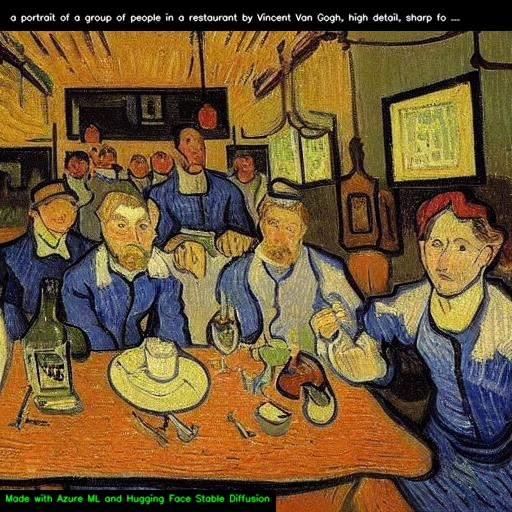

In [32]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=50)

In [33]:
prompt = "a portrait of a group of children in the street by Jean-Michel Basquiat,\
 high detail, sharp focus, 4k"


Running Stable diffusion to generate an image from text:

a portrait of a group of children in the street by Jean-Michel Basquiat, high detail, sharp focus, 4k

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 75 seconds

Image saved: images/a_portrait_of_a_group_of_children_in_the_street_by_Jean-Michel_Basquiat__high_detail__shar_____29Nov2022_085948_with_prompt.jpg


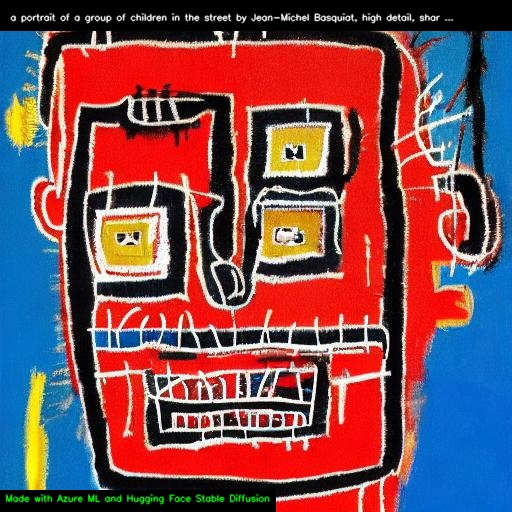

In [34]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=50)

In [35]:
prompt = "underwater world, tropical fishes, plants,\
 creatures, high detail, sharp focus"


Running Stable diffusion to generate an image from text:

underwater world, tropical fishes, plants, creatures, high detail, sharp focus

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 75 seconds

Image saved: images/underwater_world__tropical_fishes__plants__creatures__high_detail__sharp_focus_29Nov2022_090104_with_prompt.jpg


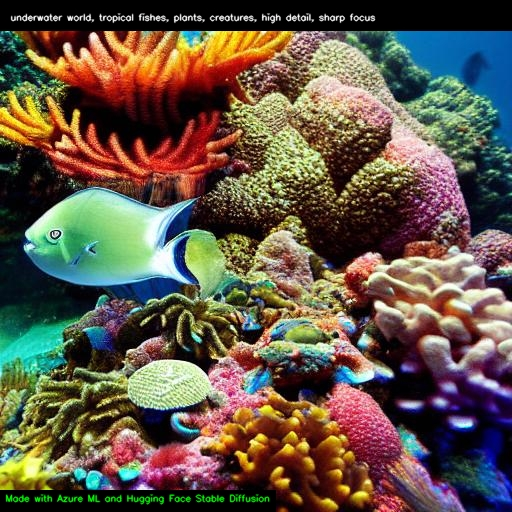

In [36]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=50)

In [37]:
prompt = "picture of dimly lit living room, minimalist furniture,\
 vaulted ceiling, huge room, floor to ceiling window with an ocean view, nighttime"


Running Stable diffusion to generate an image from text:

picture of dimly lit living room, minimalist furniture, vaulted ceiling, huge room, floor to ceiling window with an ocean view, nighttime

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 75 seconds

Image saved: images/picture_of_dimly_lit_living_room__minimalist_furniture__vaulted_ceiling__huge_room__floor______29Nov2022_090225_with_prompt.jpg


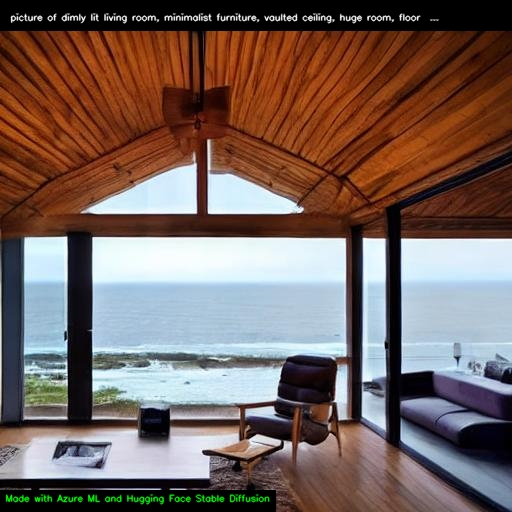

In [38]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=50)

In [39]:
prompt = "A luxury red supercar in drive way of beautiful modern villa\
 with trees in the background"


Running Stable diffusion to generate an image from text:

A luxury red supercar in drive way of beautiful modern villa with trees in the background

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 75 seconds

Image saved: images/A_luxury_red_supercar_in_drive_way_of_beautiful_modern_villa_with_trees_in_the_background_29Nov2022_090343_with_prompt.jpg


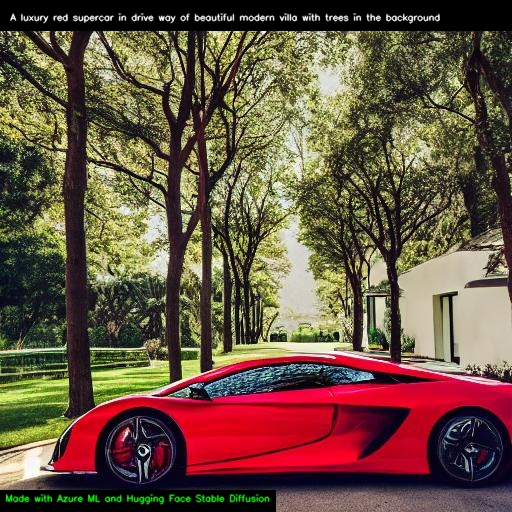

In [40]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=50)

In [41]:
prompt = "a close-up portrait of a tyger by Salvador Dali,\
 vivid, abstract art, colorful, vibrant"


Running Stable diffusion to generate an image from text:

a close-up portrait of a tyger by Salvador Dali, vivid, abstract art, colorful, vibrant

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 75 seconds

Image saved: images/a_close-up_portrait_of_a_tyger_by_Salvador_Dali__vivid__abstract_art__colorful__vibrant_29Nov2022_090504_with_prompt.jpg


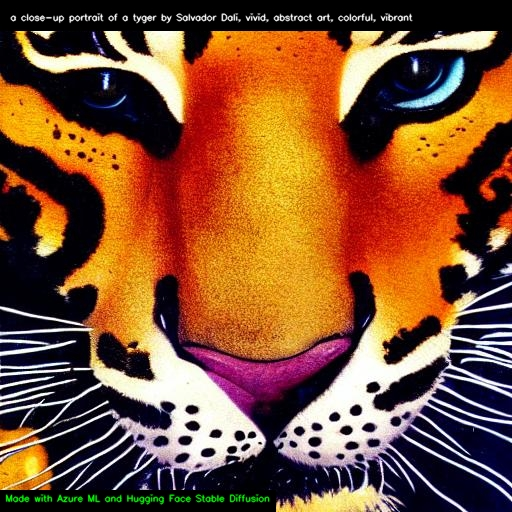

In [42]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=50)

In [43]:
prompt = "A digital illustration of a steampunk flying machine in the sky\
 with cogs and mechanisms and birds, 4k, detailed, trending in artstation, fantasy vivid colors"


Running Stable diffusion to generate an image from text:

A digital illustration of a steampunk flying machine in the sky with cogs and mechanisms and birds, 4k, detailed, trending in artstation, fantasy vivid colors

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 75 seconds

Image saved: images/A_digital_illustration_of_a_steampunk_flying_machine_in_the_sky_with_cogs_and_mechanisms_a_____29Nov2022_090625_with_prompt.jpg


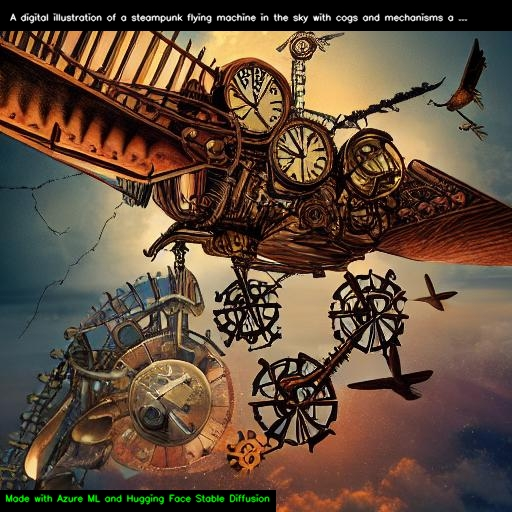

In [44]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=50)

In [45]:
prompt = "A digital Illustration of the Babel tower, 4k, detailed, trending in artstation,\
 fantasy vivid colors"


Running Stable diffusion to generate an image from text:

A digital Illustration of the Babel tower, 4k, detailed, trending in artstation, fantasy vivid colors

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 75 seconds

Image saved: images/A_digital_Illustration_of_the_Babel_tower__4k__detailed__trending_in_artstation__fantasy_v_____29Nov2022_090816_with_prompt.jpg


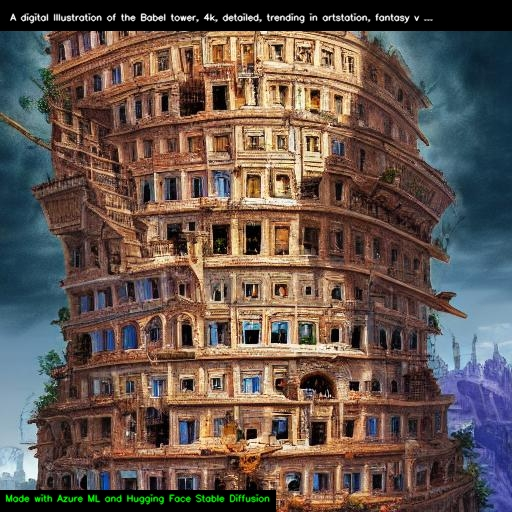

In [46]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=50)

In [47]:
prompt = "A beautiful mansion with flowered gardens and a fountain,\
 painting, oil on canvas, 4k, detailed, Thomas Cole"


Running Stable diffusion to generate an image from text:

A beautiful mansion with flowered gardens and a fountain, painting, oil on canvas, 4k, detailed, Thomas Cole

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 75 seconds

Image saved: images/A_beautiful_mansion_with_flowered_gardens_and_a_fountain__painting__oil_on_canvas__4k__det_____29Nov2022_090940_with_prompt.jpg


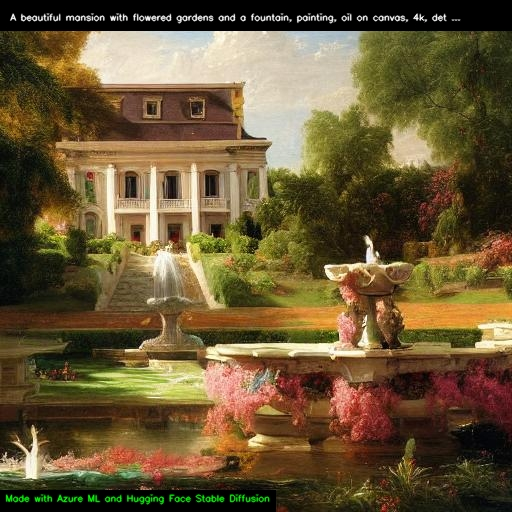

In [48]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=50)

In [49]:
prompt = "A beautiful mansion with flowered gardens and a fountain,\
 painting, oil on canvas, 4k, detailed, Pablo Picasso"


Running Stable diffusion to generate an image from text:

A beautiful mansion with flowered gardens and a fountain, painting, oil on canvas, 4k, detailed, Pablo Picasso

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 75 seconds

Image saved: images/A_beautiful_mansion_with_flowered_gardens_and_a_fountain__painting__oil_on_canvas__4k__det_____29Nov2022_091055_with_prompt.jpg


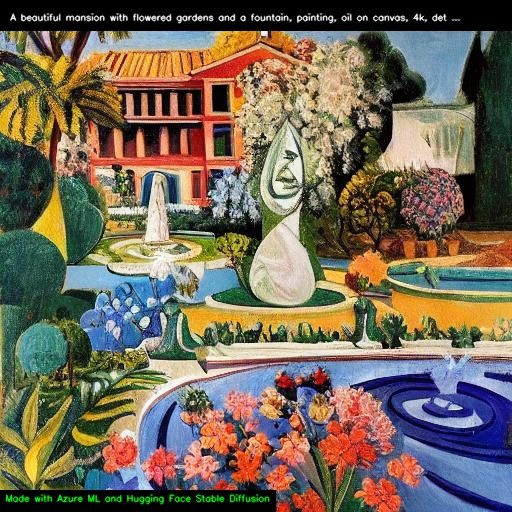

In [50]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=50)

In [51]:
prompt = "A beautiful mansion with flowered gardens and a fountain,\
 painting, oil on canvas, 4k, detailed, Claude Monet"


Running Stable diffusion to generate an image from text:

A beautiful mansion with flowered gardens and a fountain, painting, oil on canvas, 4k, detailed, Claude Monet

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 75 seconds

Image saved: images/A_beautiful_mansion_with_flowered_gardens_and_a_fountain__painting__oil_on_canvas__4k__det_____29Nov2022_091210_with_prompt.jpg


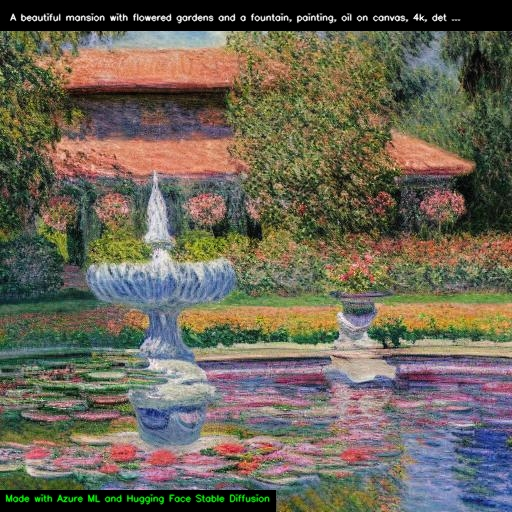

In [52]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=50)

In [53]:
prompt = "A beautiful mansion with flowered gardens and a fountain,\
 painting, oil on canvas, 4k, detailed, Banksy"


Running Stable diffusion to generate an image from text:

A beautiful mansion with flowered gardens and a fountain, painting, oil on canvas, 4k, detailed, Banksy

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 75 seconds

Image saved: images/A_beautiful_mansion_with_flowered_gardens_and_a_fountain__painting__oil_on_canvas__4k__det_____29Nov2022_091325_with_prompt.jpg


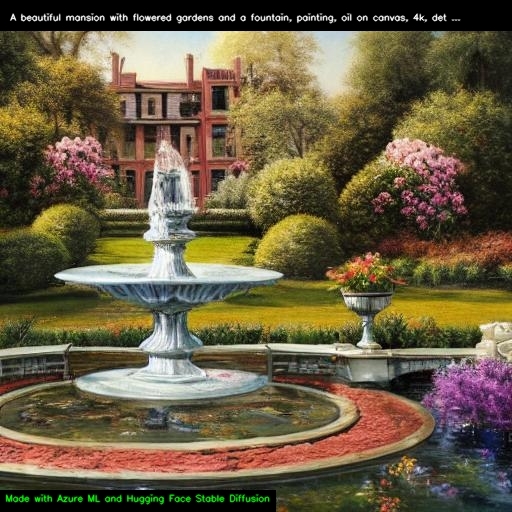

In [54]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=50)

In [55]:
prompt = "A group of people in the street with cats and dogs, painting, 8k,\
 detailed, Jean-Michel Basquiat"


Running Stable diffusion to generate an image from text:

A group of people in the street with cats and dogs, painting, 8k, detailed, Jean-Michel Basquiat

Please wait...


  0%|          | 0/76 [00:00<?, ?it/s]

Done in 111 seconds

Image saved: images/A_group_of_people_in_the_street_with_cats_and_dogs__painting__8k__detailed__Jean-Michel_Ba_____29Nov2022_091441_with_prompt.jpg


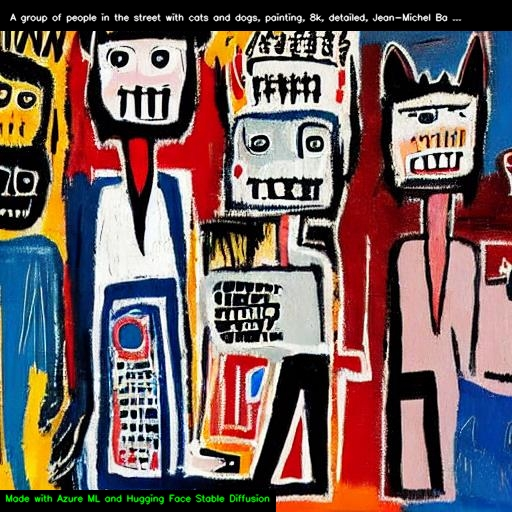

In [56]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=75)

In [57]:
prompt = "a beautiful painting brutalist buildings making up a small city\
 with crowds of people in an icy mountain by wes anderson"


Running Stable diffusion to generate an image from text:

a beautiful painting brutalist buildings making up a small city with crowds of people in an icy mountain by wes anderson

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 75 seconds

Image saved: images/a_beautiful_painting_brutalist_buildings_making_up_a_small_city_with_crowds_of_people_in_a_____29Nov2022_091632_with_prompt.jpg


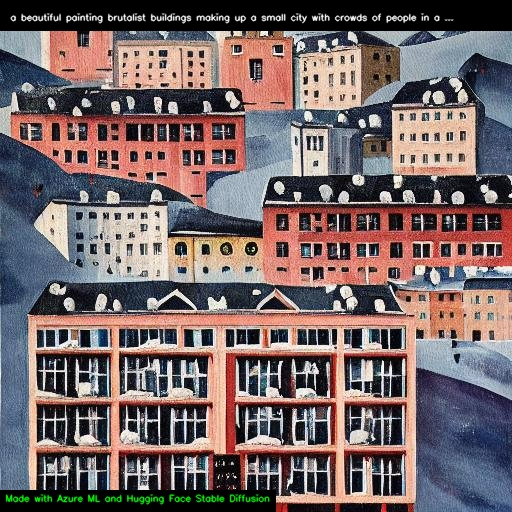

In [58]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=50)

In [59]:
prompt = "painting of a beautiful sea landscape, detailed, intricate, artstation, vibrant"


Running Stable diffusion to generate an image from text:

painting of a beautiful sea landscape, detailed, intricate, artstation, vibrant

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 74 seconds

Image saved: images/painting_of_a_beautiful_sea_landscape__detailed__intricate__artstation__vibrant_29Nov2022_091920_with_prompt.jpg


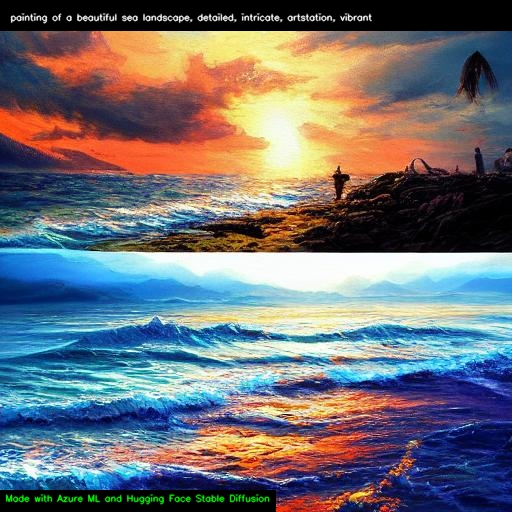

In [60]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=50)

In [61]:
prompt = "Seaside town painted like a watercolor, good composition, hyper realistic"


Running Stable diffusion to generate an image from text:

Seaside town painted like a watercolor, good composition, hyper realistic

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 73 seconds

Image saved: images/Seaside_town_painted_like_a_watercolor__good_composition__hyper_realistic_29Nov2022_092253_with_prompt.jpg


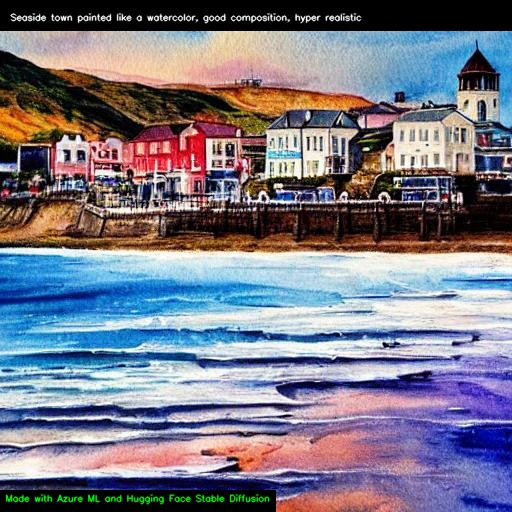

In [62]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=50)

In [63]:
prompt = "Egyptian mythology illustration, good composition, hyper realistic"


Running Stable diffusion to generate an image from text:

Egyptian mythology illustration, good composition, hyper realistic

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 74 seconds

Image saved: images/Egyptian_mythology_illustration__good_composition__hyper_realistic_29Nov2022_092407_with_prompt.jpg


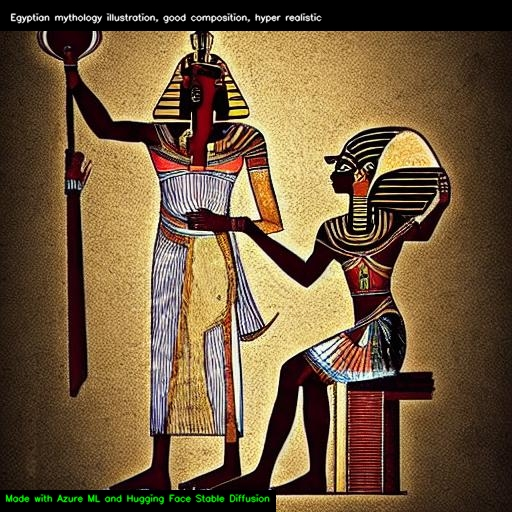

In [64]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=50)

In [65]:
prompt = "Modernist design home architecture with a pool, good composition, hyper realistic"


Running Stable diffusion to generate an image from text:

Modernist design home architecture with a pool, good composition, hyper realistic

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 74 seconds

Image saved: images/Modernist_design_home_architecture_with_a_pool__good_composition__hyper_realistic_29Nov2022_092521_with_prompt.jpg


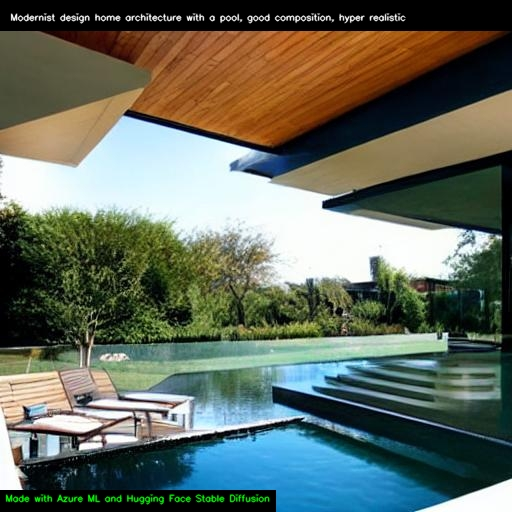

In [66]:
text_to_image(prompt,
              same=False,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=50)

In [67]:
prompt = "walking on the starlight,dreamy ultra wide shot, atmospheric,\
 hyper realistic, epic composition, cinematic, octane render, artstation\
 landscape vista photograph"


Running Stable diffusion to generate an image from text:

walking on the starlight,dreamy ultra wide shot, atmospheric, hyper realistic, epic composition, cinematic, octane render, artstation landscape vista photograph

Please wait...


  0%|          | 0/201 [00:00<?, ?it/s]

Done in 288 seconds

Image saved: images/walking_on_the_starlight_dreamy_ultra_wide_shot__atmospheric__hyper_realistic__epic_compos_____29Nov2022_092636_with_prompt.jpg


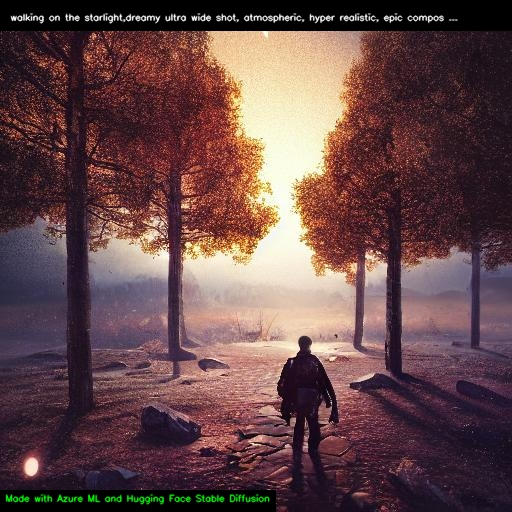

In [68]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=200)

In [69]:
prompt = "A tropical bird, high resolution, sitting on the grass, good composition, hyper realistic"


Running Stable diffusion to generate an image from text:

A tropical bird, high resolution, sitting on the grass, good composition, hyper realistic

Please wait...


  0%|          | 0/101 [00:00<?, ?it/s]

Done in 147 seconds

Image saved: images/A_tropical_bird__high_resolution__sitting_on_the_grass__good_composition__hyper_realistic_29Nov2022_093124_with_prompt.jpg


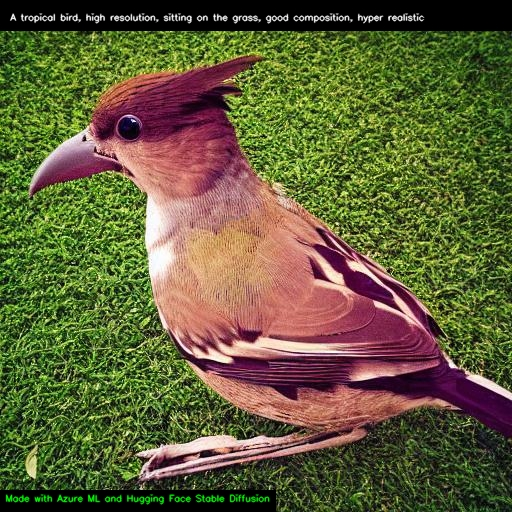

In [70]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=100)

In [71]:
prompt = "new disney character as Sean Connery, highly detailed,\
 extremely high quality, hd, professional photographer,\
 lifelike, top – rated, award winning, cinematic, realistic, detailed lighting,\
 detailed shadows, sharp, no blur, edited, corrected, trending"


Running Stable diffusion to generate an image from text:

new disney character as Sean Connery, highly detailed, extremely high quality, hd, 4 k, 8 k, professional photographer, 4 0 mp, lifelike, top – rated, award winning, cinematic, realistic, detailed lighting, detailed shadows, sharp, no blur, edited, corrected, trending

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 75 seconds

Image saved: images/new_disney_character_as_Sean_Connery__highly_detailed__extremely_high_quality__hd__4_k__8______29Nov2022_093350_with_prompt.jpg


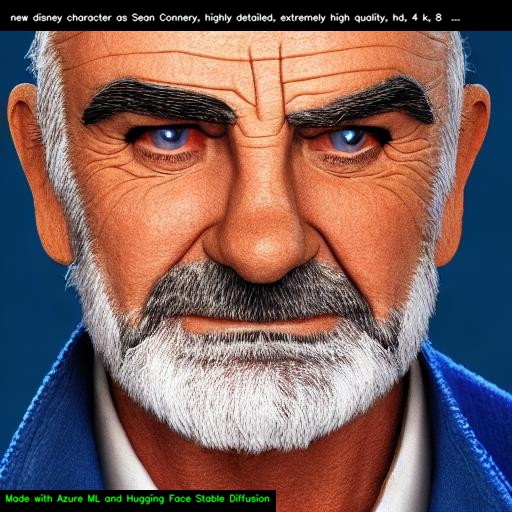

In [72]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=50)

In [73]:
prompt = "beautiful kitchen, interior architecture, rendered in octane,\
 photorealistic, highly detailed"


Running Stable diffusion to generate an image from text:

beautiful kitchen, interior architecture, rendered in octane, photorealistic, highly detailed

Please wait...


  0%|          | 0/101 [00:00<?, ?it/s]

Done in 146 seconds

Image saved: images/beautiful_kitchen__interior_architecture__rendered_in_octane__photorealistic__highly_detailed_29Nov2022_093546_with_prompt.jpg


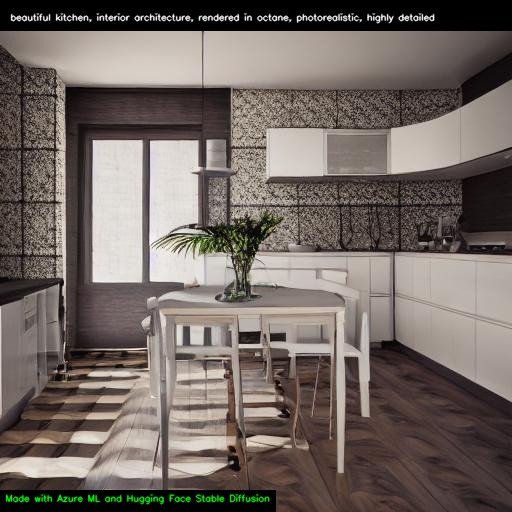

In [74]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=100)

In [75]:
prompt = "typical Japanese food, good composition, hyper realistic,\
 professional photographer"


Running Stable diffusion to generate an image from text:

typical Japanese food, good composition, hyper realistic, professional photographer

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 75 seconds

Image saved: images/typical_Japanese_food__good_composition__hyper_realistic__professional_photographer_29Nov2022_093811_with_prompt.jpg


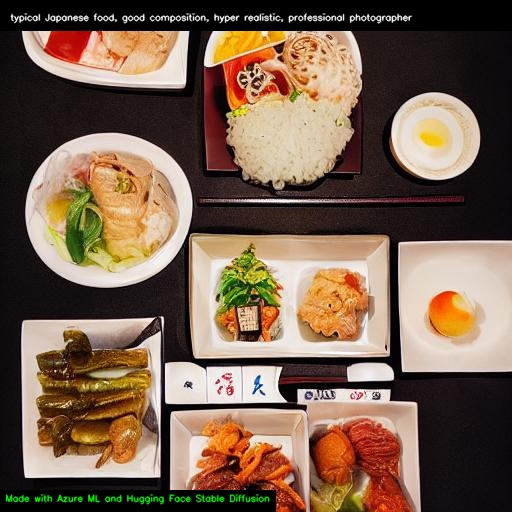

In [76]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=50)

In [77]:
prompt = "French revolution with Bastille castle in the background, foggy day, hyper realistic"


Running Stable diffusion to generate an image from text:

French revolution with Bastille castle in the background, foggy day, hyper realistic

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 75 seconds

Image saved: images/French_revolution_with_Bastille_castle_in_the_background__foggy_day__hyper_realistic_29Nov2022_093927_with_prompt.jpg


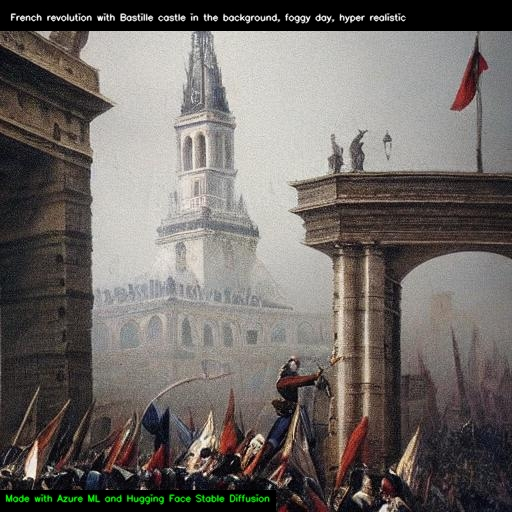

In [78]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=50)

In [79]:
prompt = "crazy insane, high energy, magic, hyper realistic, detailed and realistic portrait of a woman,\
 round eyes and short messy hair shot outside, skin texture, chapped lips,\
 portrait photography, 85mm lens, magical photography,\
 photo realism, ultra-detailed, intimate portrait composition, Cinestill 800T,\
 symmetrical perfect body, sharp focus, intricate details"


Running Stable diffusion to generate an image from text:

crazy insane, high energy, magic, hyper realistic, detailed and realistic portrait of a woman, round eyes and short messy hair shot outside, skin texture, chapped lips, portrait photography, 85mm lens, magical photography, photo realism, ultra-detailed, intimate portrait composition, Cinestill 800T, symmetrical perfect body, sharp focus, intricate details

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 75 seconds

Image saved: images/crazy_insane__high_energy__magic__hyper_realistic__detailed_and_realistic_portrait_of_a_wo_____29Nov2022_094042_with_prompt.jpg


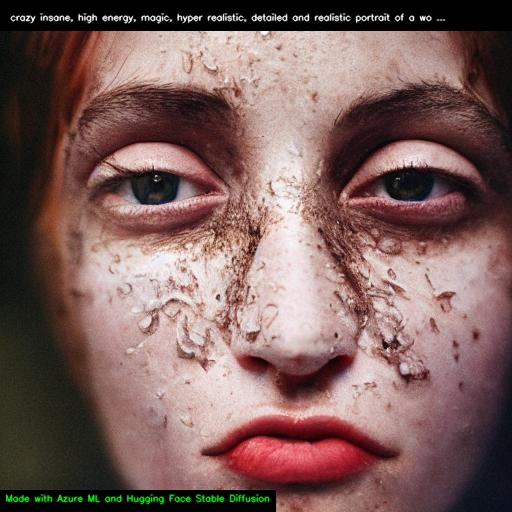

In [80]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=50)

In [81]:
prompt = "crazy insane, high energy, magic, hyper realistic, detailed and realistic portrait of a old woman,\
 round eyes and long blond messy hair shot outside, skin texture, chapped lips,\
 portrait photography, 85mm lens, photo realism, ultra-detailed, intimate portrait composition, Cinestill 800T,\
 sharp focus, intricate details"


Running Stable diffusion to generate an image from text:

crazy insane, high energy, magic, hyper realistic, detailed and realistic portrait of a old woman, round eyes and long blond messy hair shot outside, skin texture, chapped lips, portrait photography, 85mm lens, photo realism, ultra-detailed, intimate portrait composition, Cinestill 800T, sharp focus, intricate details

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 75 seconds

Image saved: images/crazy_insane__high_energy__magic__hyper_realistic__detailed_and_realistic_portrait_of_a_ol_____29Nov2022_094157_with_prompt.jpg


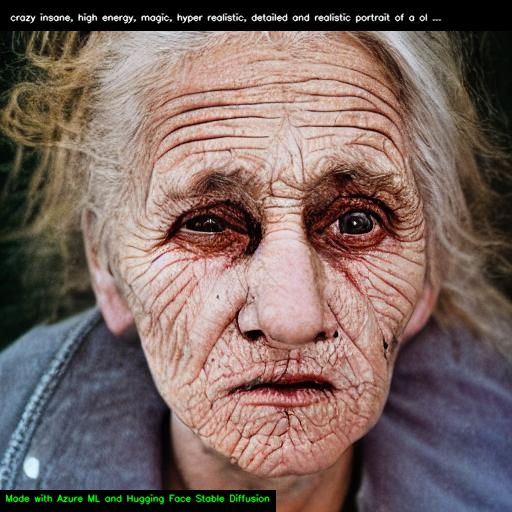

In [82]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=50)

In [83]:
prompt = "Cute and adorable rat wizard, wearing coat and suit, steampunk,\
 lantern, anthromorphic, steampunk, vivid colors"


Running Stable diffusion to generate an image from text:

Cute and adorable rat wizard, wearing coat and suit, steampunk, lantern, anthromorphic, steampunk, vivid colors

Please wait...


  0%|          | 0/51 [00:00<?, ?it/s]

Done in 75 seconds

Image saved: images/Cute_and_adorable_rat_wizard__wearing_coat_and_suit__steampunk__lantern__anthromorphic__st_____29Nov2022_094313_with_prompt.jpg


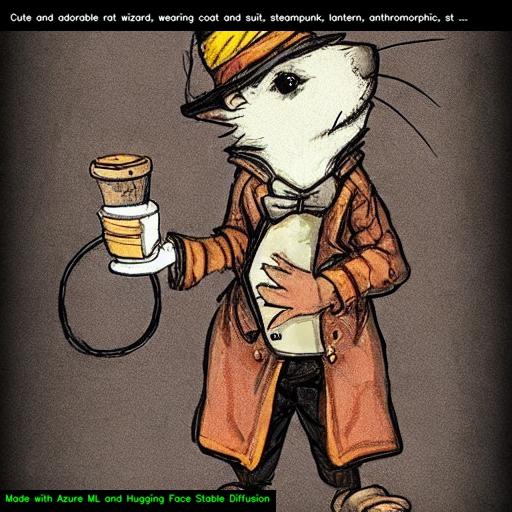

In [84]:
text_to_image(prompt,
              same=True,
              disp=True,
              guidance_scale=7.5,
              num_inference_steps=50)

## 5. Save all the generated images into an animated GIF File

In [85]:
print("Generating an animated GIF file of all the generated images...")

gif_file = 'stable_diffusion_examples.gif'
duration_sec = 3
fps = 30

images_list = []

images = [file for file in os.listdir(IMAGES_DIR) 
          if file.endswith('jpg') and file.find("_with_prompt") != -1]

for imagefile in images:
    images_list.append(imageio.imread(IMAGES_DIR + '/' + imagefile))

imageio.mimsave(gif_file, images_list, duration=duration_sec, fps=fps)

print("\nDone. File saved:", gif_file)
print("Total of images used:", len(images))

Generating an animated GIF file of all the generated images...

Done. File saved: stable_diffusion_examples.gif
Total of images used: 37


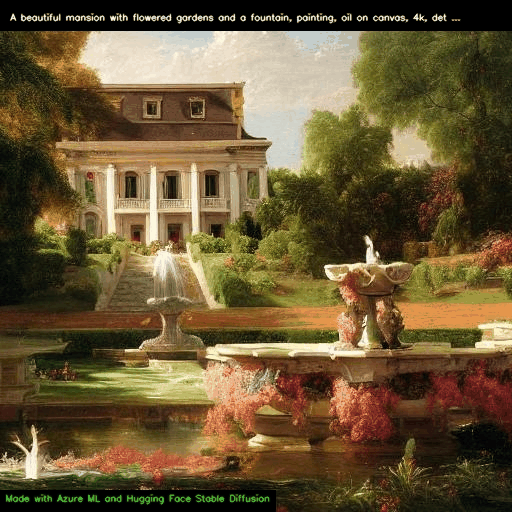

In [86]:
display(Image(filename=gif_file, width=512, height=512))